# Import module

In [1]:
import numpy as np
import pandas as pd 
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
# import sctk

In [2]:
# Configure rpy2 to Use the Correct R Installation:
import os
os.environ['R_HOME'] = '/nfs/team205/kk18/miniconda3/envs/vitro/lib/R'
# check
from rpy2.rinterface_lib import openrlib
print(openrlib.R_HOME)

/nfs/team205/kk18/miniconda3/envs/vitro/lib/R


In [3]:
import milopy.core as milo
import milopy.plot as milopl
import milopy.utils

In [4]:
import session_info
session_info.show()

In [5]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/nfs/team205/kk18/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

In [6]:
sc.settings.set_figure_params(dpi=120)

# Parameters

In [7]:
outdir = '/nfs/team205/heart/anndata_objects/Foetal/multiome_ATAC/ArchR/project_output/Milo_nhoods_gex/scVI_mid_grain_mod'

# Differential acundance test (Milo)

In [8]:
!ls /nfs/team205/heart/anndata_objects/Foetal/scVI/subsets

Foetal_multiome_AtrialCardiomyocytes_plusCCS_one-layer_added-cov-region.h5ad
Foetal_multiome_AtrialCardiomyocytes_plusCCS_one-layer_added-cov-region_subsampled-n1000.h5ad
Foetal_multiome_AtrialCardiomyocytes_plusCCS_one-layer.h5ad
Foetal_multiome_AtrialCardiomyocytes_plusCCS_three-layer.h5ad
Foetal_multiome_AtrialCardiomyocytes_plusCCS_two-layer.h5ad
Foetal_multiome_BloodVesselEndothelialCells_one-layer_added-cov-region.h5ad
Foetal_multiome_BloodVesselEndothelialCells_one-layer_added-cov-region_subsampled-n1000.h5ad
Foetal_multiome_BloodVesselEndothelialCells_one-layer.h5ad
Foetal_multiome_BloodVesselEndothelialCells_three-layer.h5ad
Foetal_multiome_BloodVesselEndothelialCells_two-layer.h5ad
Foetal_multiome_EndocardialCells_one-layer_added-cov-region.h5ad
Foetal_multiome_EndocardialCells_one-layer_added-cov-region_subsampled-n1000.h5ad
Foetal_multiome_EndocardialCells_one-layer.h5ad
Foetal_multiome_EndocardialCells_three-layer.h5ad
Foetal_multiome_EndocardialCells_two-layer.h5ad
Foetal

####### AtrialCardiomyocytes_plusCCS #######
(4381, 24444)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-pac

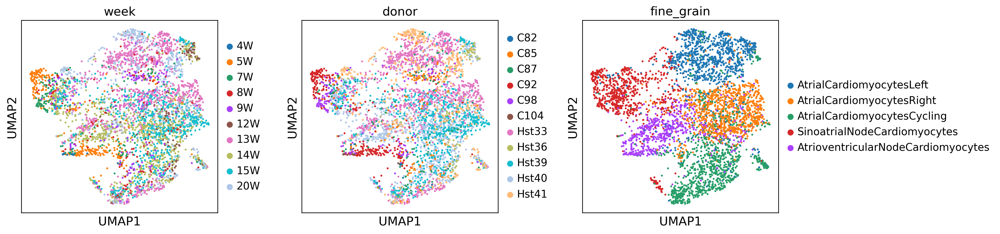

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


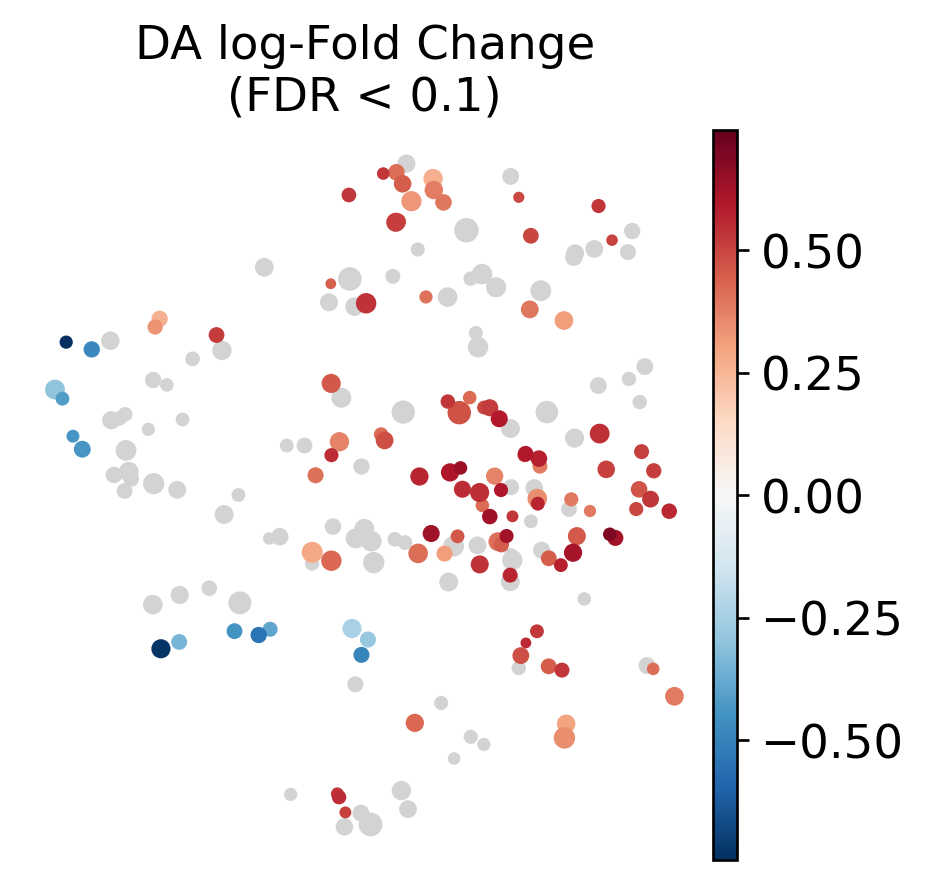

####### VentricularCardiomyocytes_plusCCS #######
(6531, 24426)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


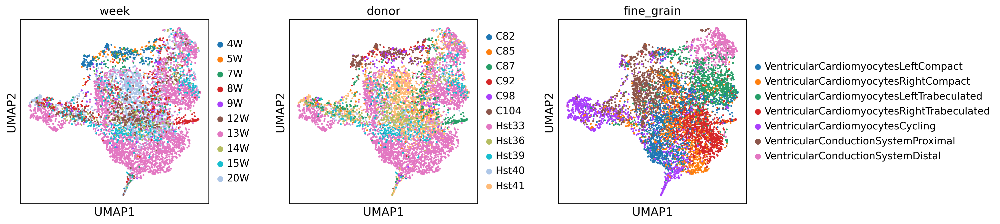

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


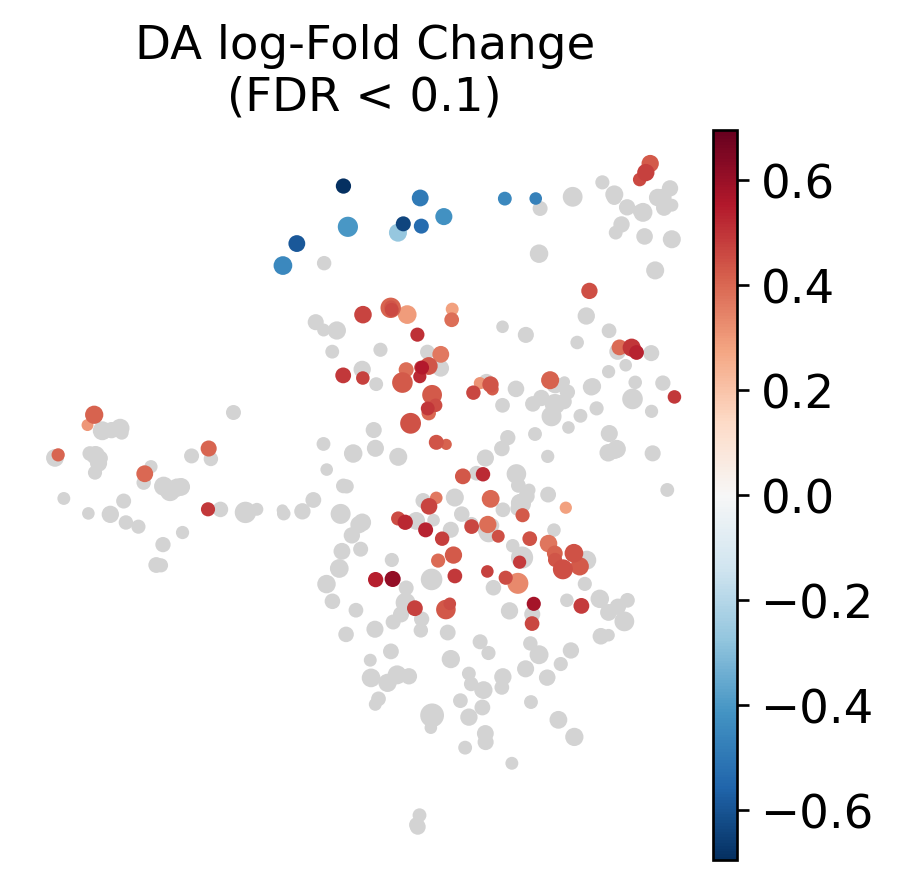

####### BloodVesselEndothelialCells #######
(3028, 24028)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


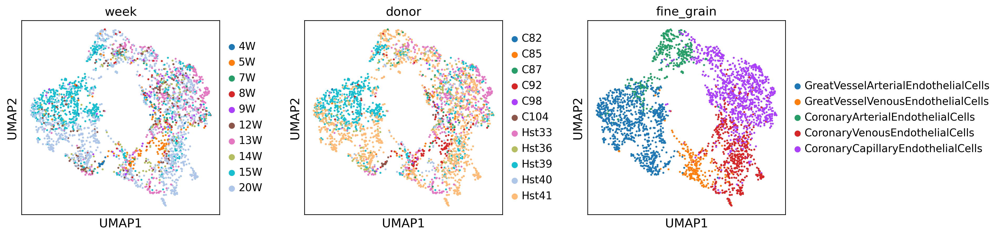

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


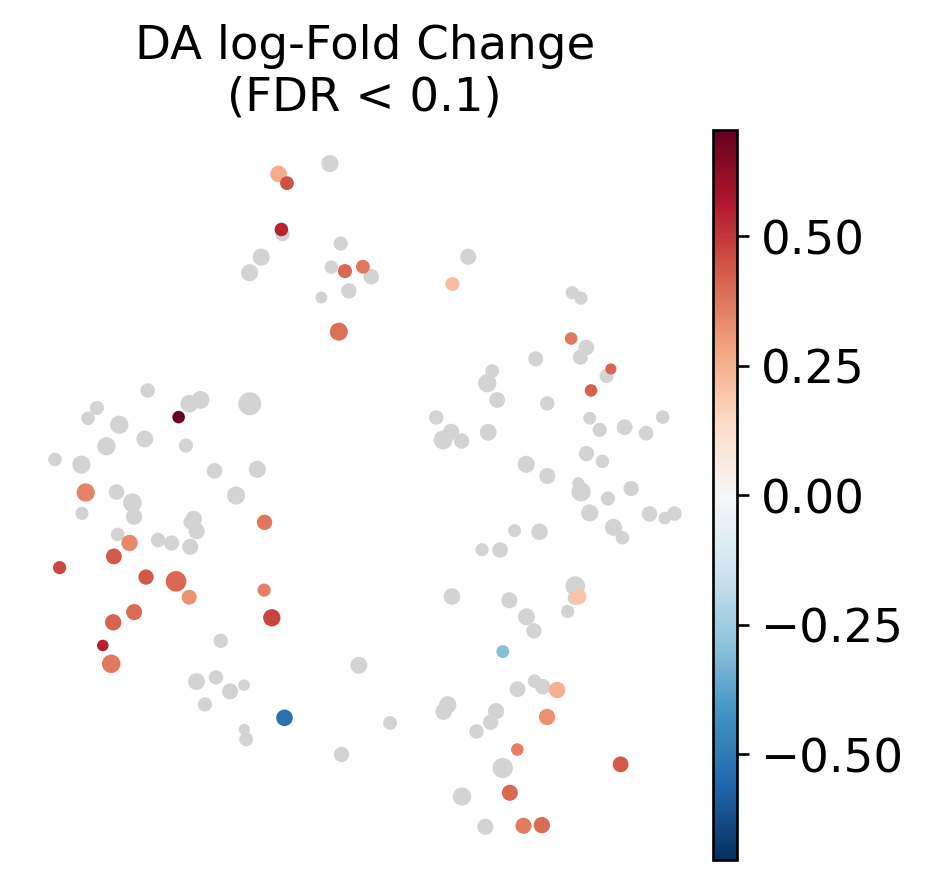

####### EndocardialCells #######
(1410, 21154)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


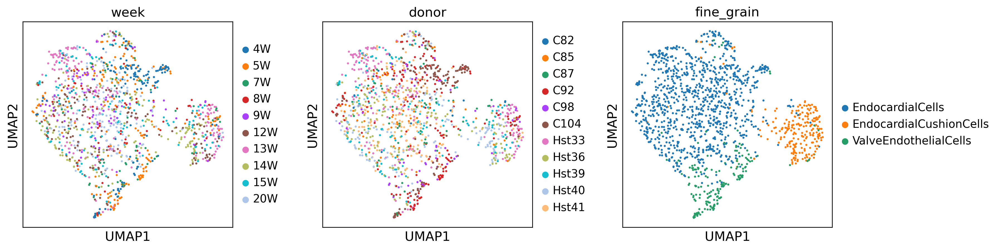

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


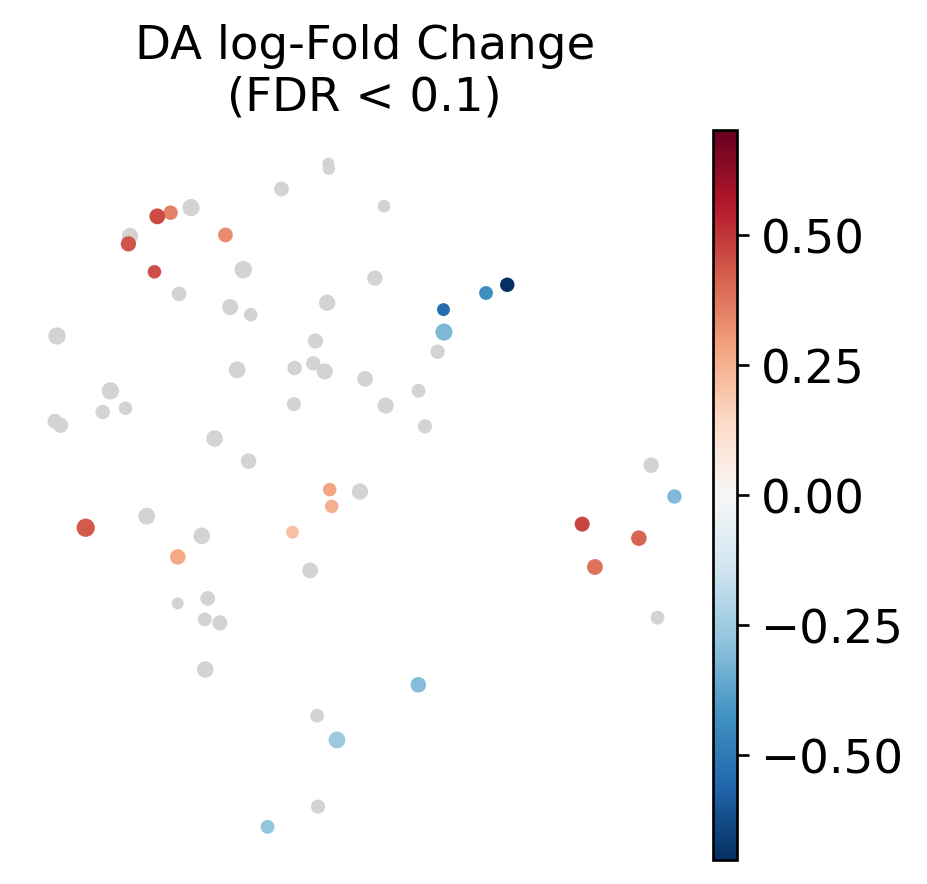

####### LymphaticEndothelialCells #######
(1000, 20680)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


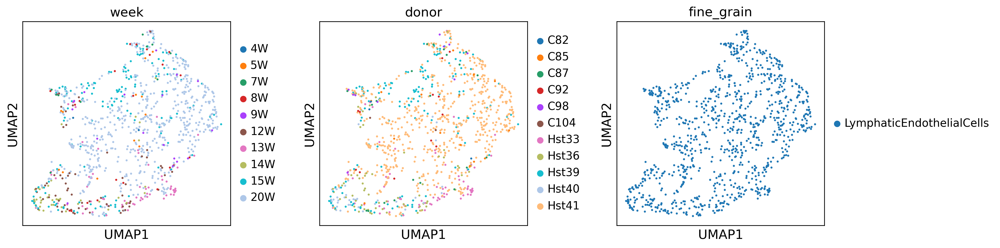

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


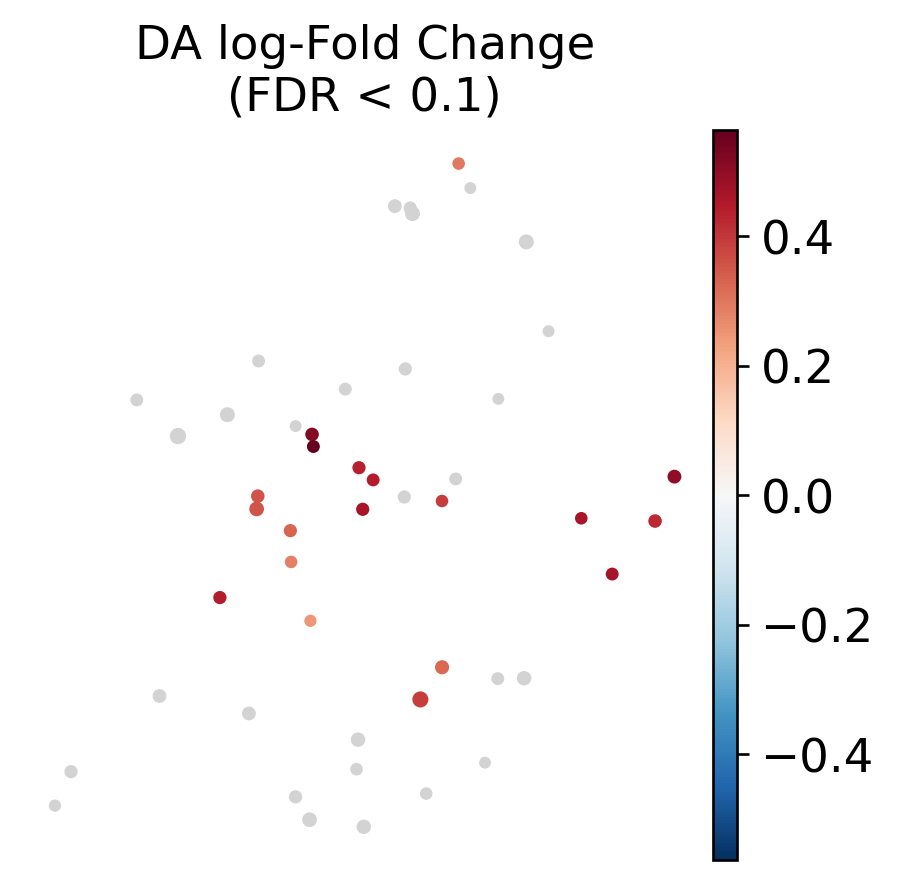

####### EpicardialCells #######
(1340, 23572)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


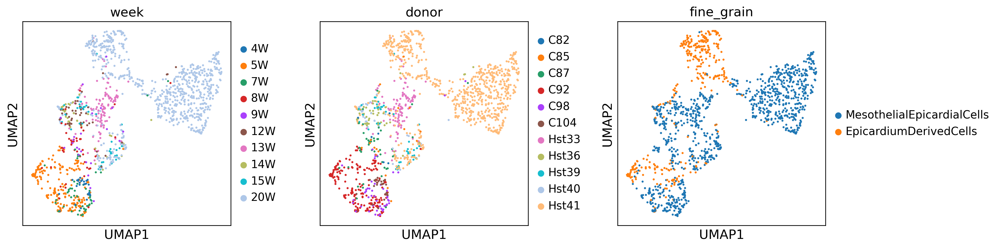

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


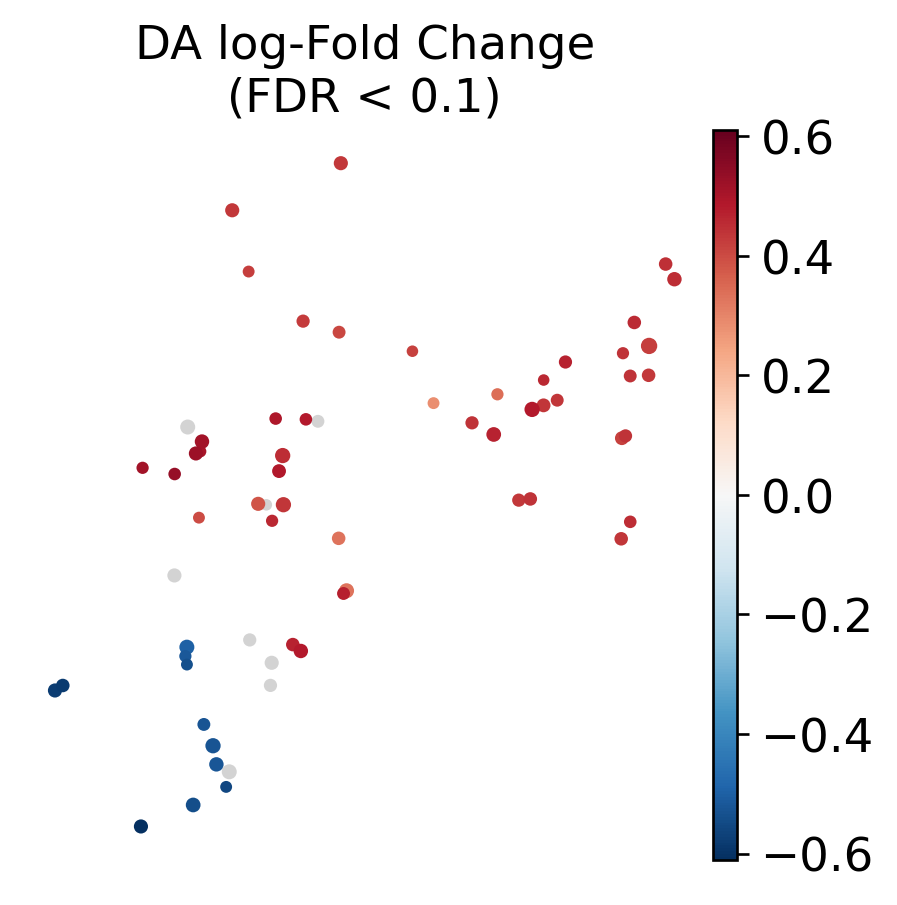

####### Fibroblasts #######
(6969, 26468)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


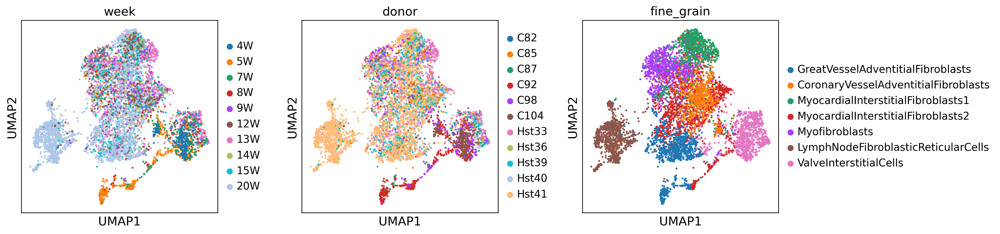

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


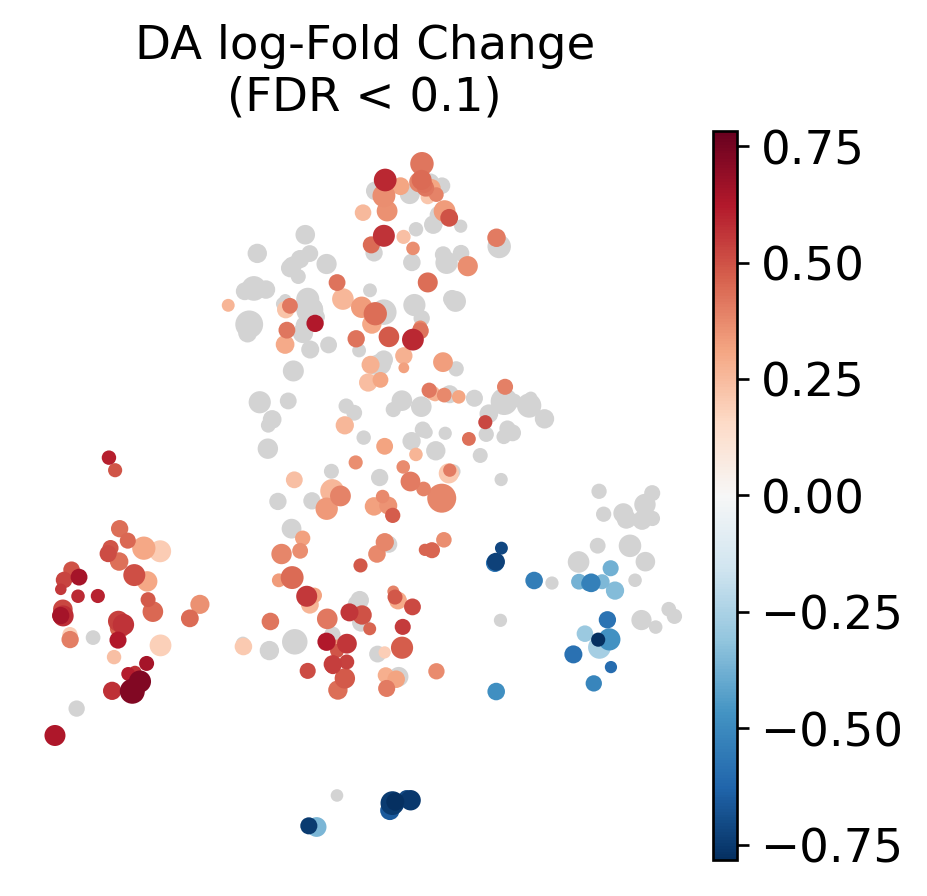

####### PericardialCells #######
(2187, 22516)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


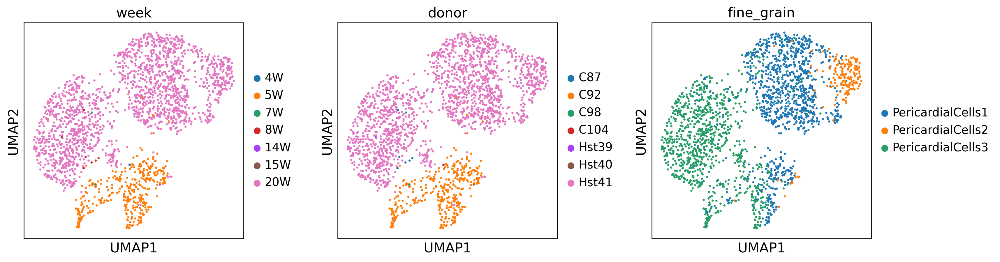

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


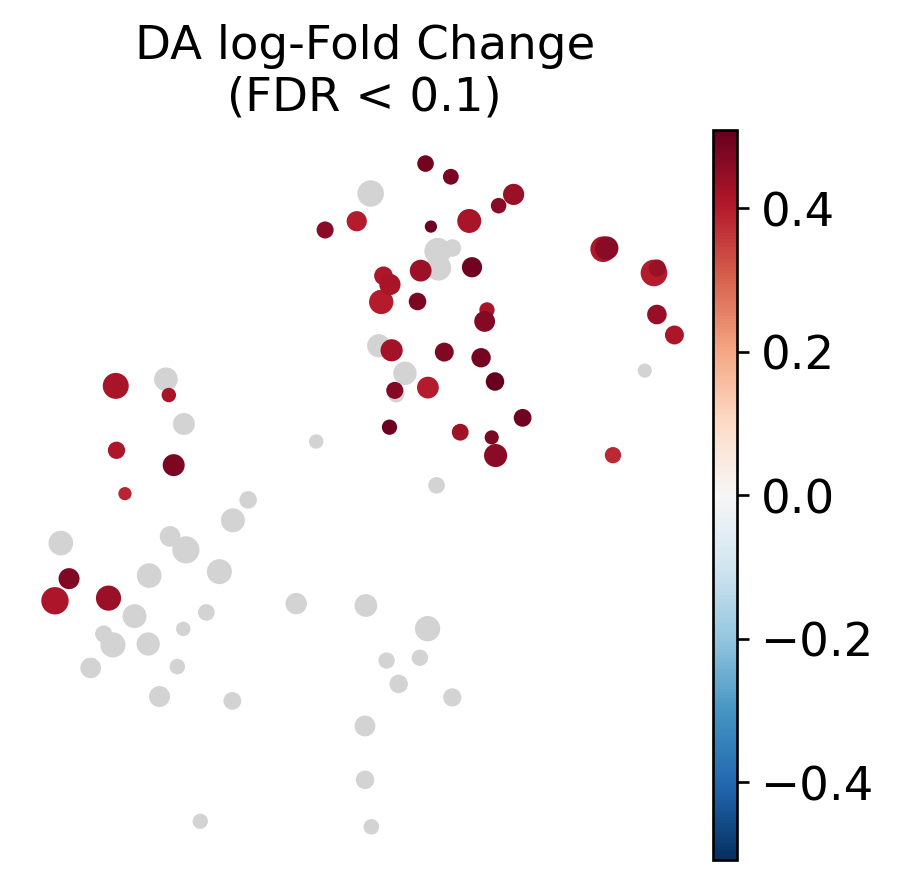

####### MuralCells #######
(3103, 23056)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


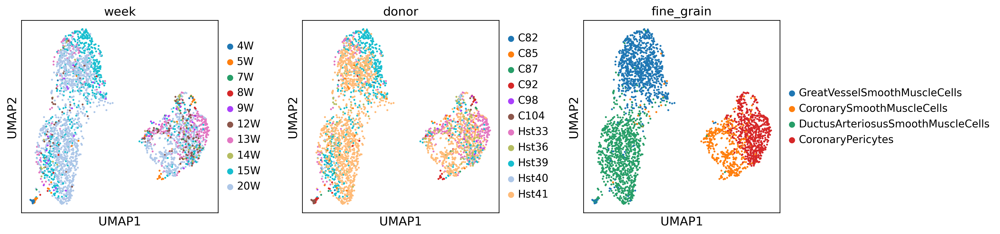

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


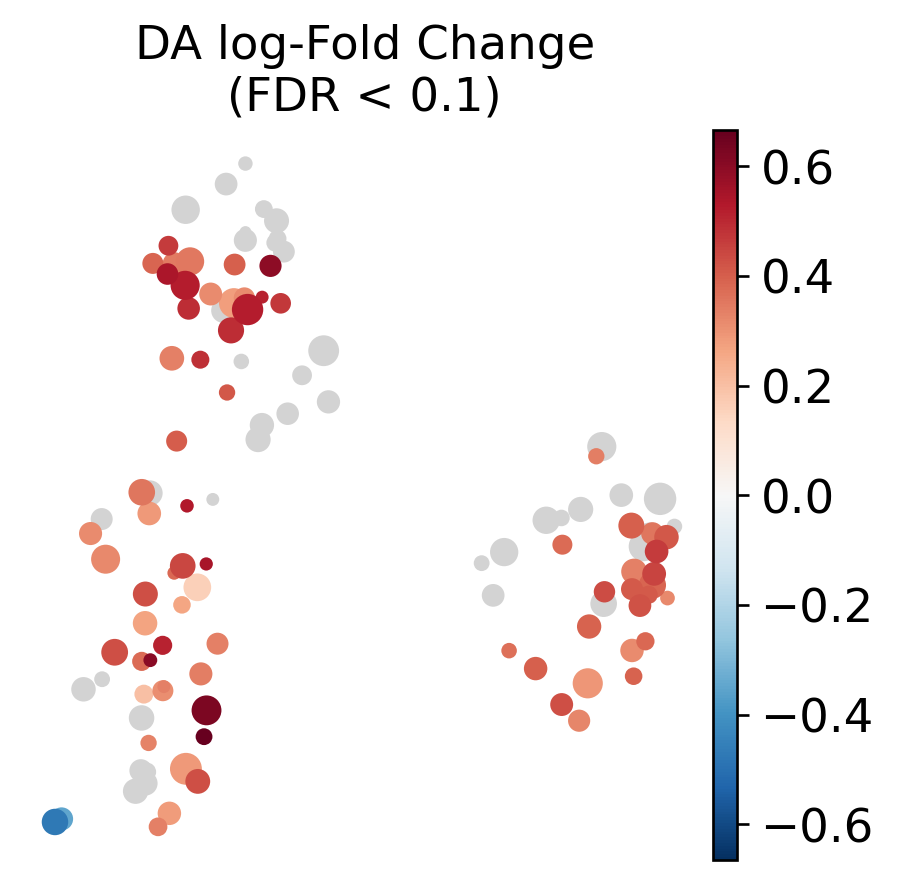

####### Neurons #######
(1101, 21561)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


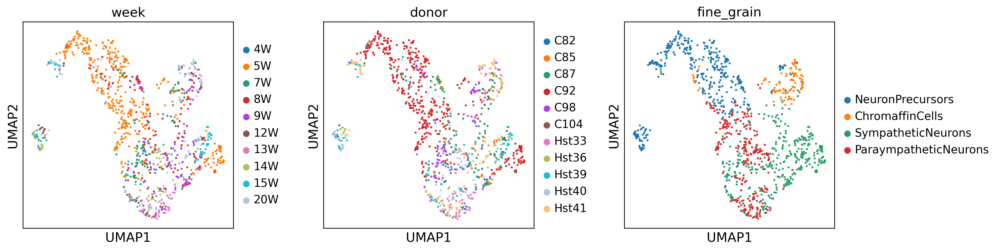

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


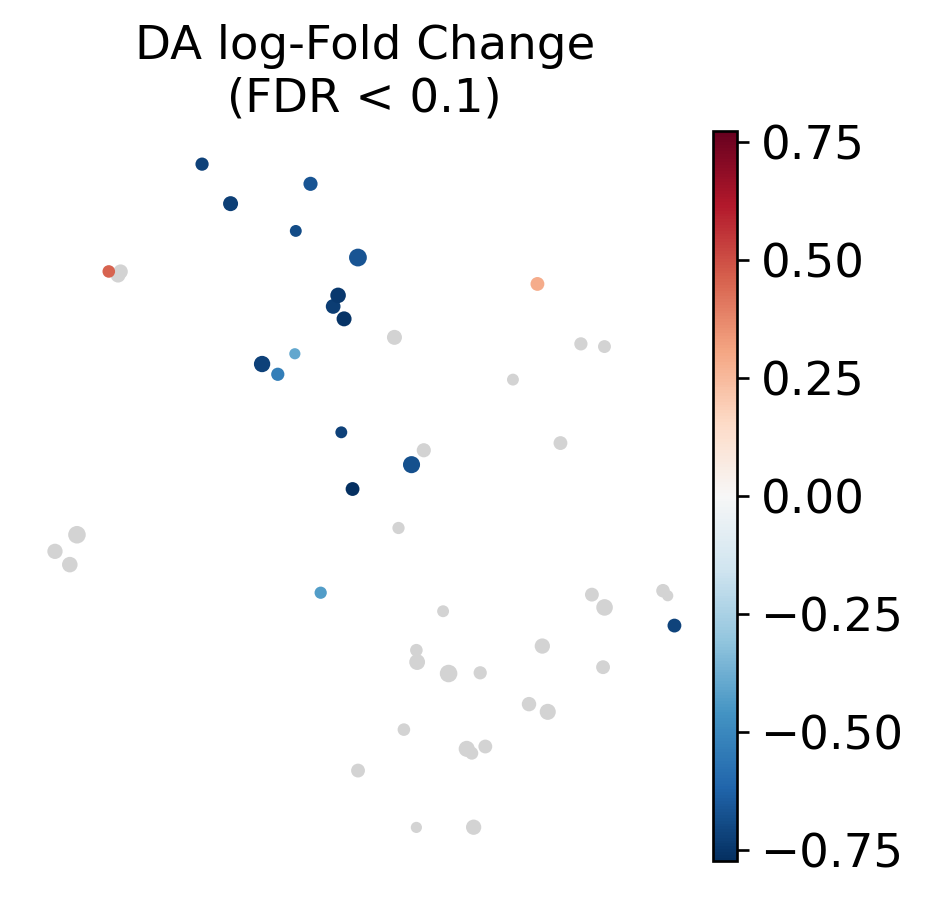

####### Glia #######
(1759, 21535)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


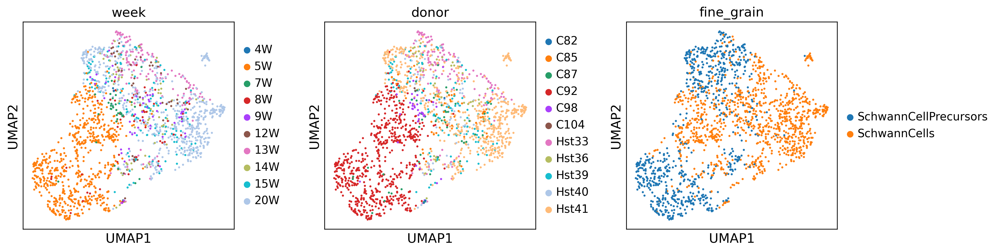

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


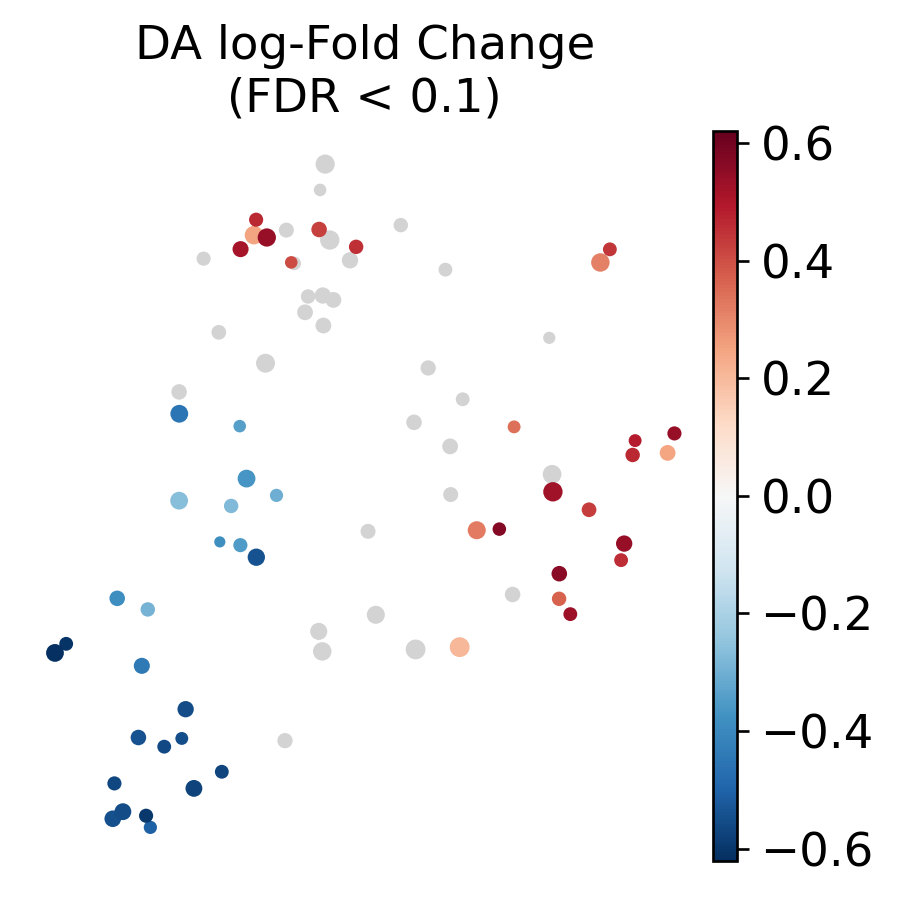

####### MyeloidCells #######
(4321, 24290)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


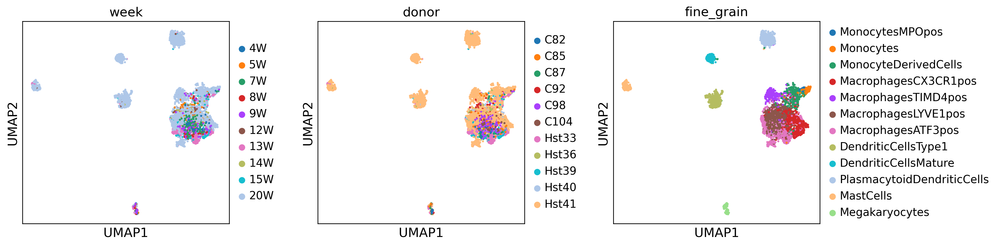

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


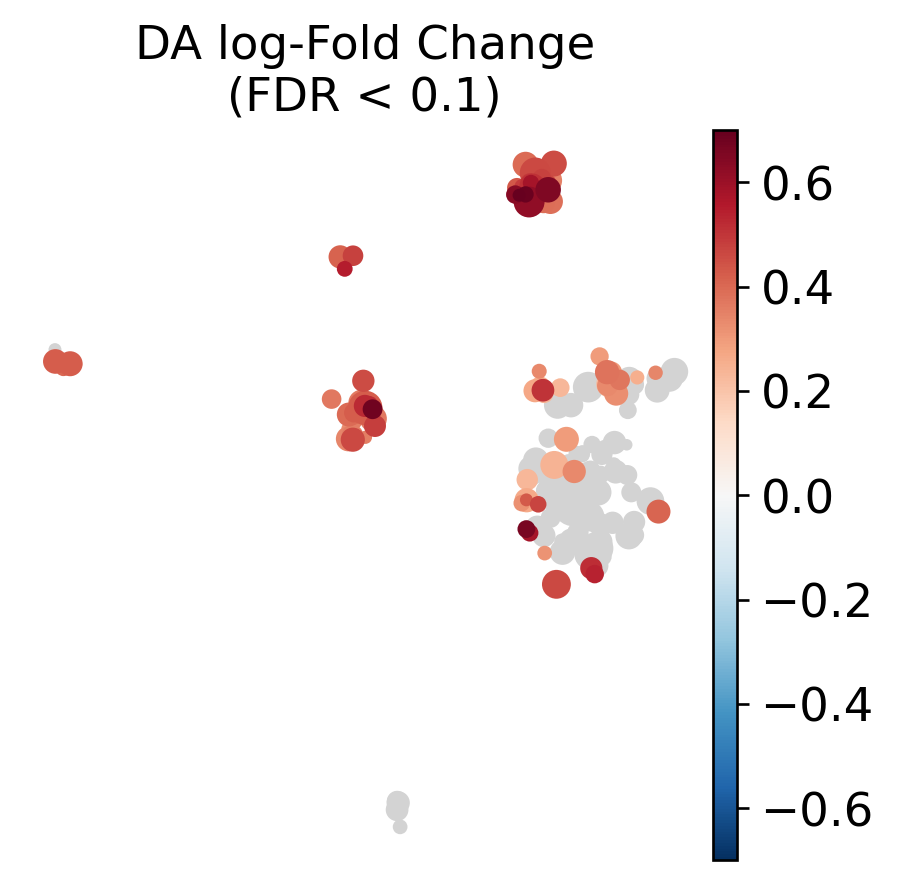

####### LymphoidCells #######
(7006, 24441)


/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


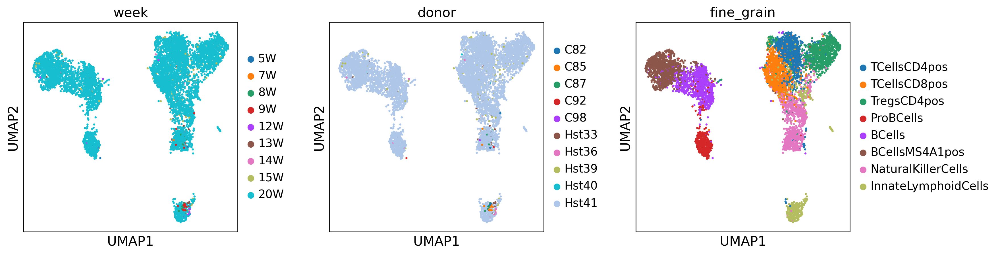

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


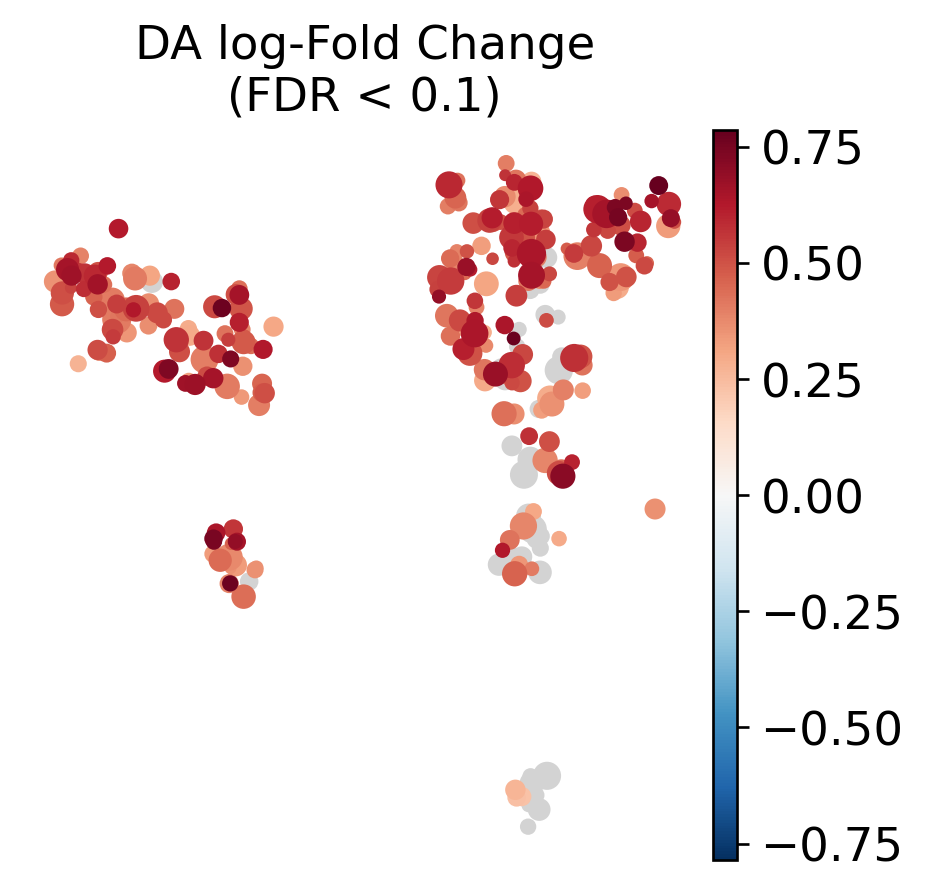

CPU times: user 2min 28s, sys: 4.19 s, total: 2min 32s
Wall time: 3min 3s


In [9]:
%%time
n_layer = 'one-layer'

adata_dict = {}
for i,celltype in enumerate(['AtrialCardiomyocytes_plusCCS',
                            'VentricularCardiomyocytes_plusCCS',
                             'BloodVesselEndothelialCells',
                             'EndocardialCells',
                            'LymphaticEndothelialCells',
                             'EpicardialCells',
                             'Fibroblasts',
                             'PericardialCells',
                             'MuralCells',
                             'Neurons',
                            'Glia',
                            'MyeloidCells',
                            'LymphoidCells']
                             ):
    print(f'####### {celltype} #######')
    
    adata_dict[celltype] = sc.read_h5ad(f'/nfs/team205/heart/anndata_objects/Foetal/scVI/subsets/Foetal_multiome_{celltype}_{n_layer}_added-cov-region_subsampled-n1000.h5ad')
    print(adata_dict[celltype].shape)
    
    # compute the k-nearest-neighbor graph that is used in both clustering and umap algorithms
    sc.pp.neighbors(adata_dict[celltype], use_rep="X_scVI", n_neighbors=15, key_added="scvi")
    # compute the umap
    sc.tl.umap(adata_dict[celltype], min_dist=0.2, neighbors_key="scvi")
    # cluster the space (we use a lower resolution to get fewer clusters than the default)
    # sc.tl.leiden(adata_dict[celltype], key_added="cluster_pvi", resolution=1, neighbors_key="peakvi")
    # plot
    sc.pl.umap(adata_dict[celltype], color=['week','donor','fine_grain'], size=20, legend_fontsize=12, wspace=0.3,
              cmap='RdPu')
    
    ## Construct neighbourhoods
    milo.make_nhoods(adata_dict[celltype], neighbors_key="scvi", prop=0.05)
    ## Count cells in neighbourhoods
    ## Milo leverages the variation in cell numbers between replicates for the same experimental condition to test for differential abundance. 
    milo.count_nhoods(adata_dict[celltype], sample_col="donor")
    # differential abundance testing
    adata_dict[celltype].obs["week_continuous"] = [int(x.split('W')[0]) for x in adata_dict[celltype].obs["week"]] #rather than adata.obs["week"].cat.codes
    milo.DA_nhoods(adata_dict[celltype], design="~ week_continuous")
    milopy.utils.build_nhood_graph(adata_dict[celltype],basis='X_umap')
    # plot
    milopl.plot_nhood_graph(adata_dict[celltype], 
                        alpha=0.1, ## SpatialFDR level (1%) 
                        min_size=3, ## Size of smallest dot
                        title = 'DA log-Fold Change\n(FDR < 0.1)'
                       )
    # store logFC
    logfcs = abs(adata_dict[celltype].uns['nhood_adata'].obs['logFC'])
    df = pd.DataFrame({'Celltype':celltype,'logFC':logfcs})
    if i==0:
        logfc_df=df.copy()
    else:
        logfc_df=pd.concat([logfc_df,df])

# save adata dictionary
utils.save_pkl(adata_dict, f'{outdir}/{n_layer}_added-cov-region_subsampled-n1000_post_milo_adata_dictionary.pkl')

# Define nhoods: Young, Old, Non-significant

In [11]:
adata_dict.keys()

dict_keys(['AtrialCardiomyocytes_plusCCS', 'VentricularCardiomyocytes_plusCCS', 'BloodVesselEndothelialCells', 'EndocardialCells', 'LymphaticEndothelialCells', 'EpicardialCells', 'Fibroblasts', 'PericardialCells', 'MuralCells', 'Neurons', 'Glia', 'MyeloidCells', 'LymphoidCells'])

In [13]:
for celltype in adata_dict.keys():
    print(celltype)
    # get adata
    ad = adata_dict[celltype]
    # define nhoods based on the enrichment
    nhoods_res = ad.uns['nhood_adata'].obs.copy()
    nhoods_res['nhood'] = [f'nhood_{x+1}' for x in range(len(nhoods_res))]
    nhoods_res.set_index('nhood',inplace=True)
    nhoods_res['enrichment'] = 'nonsignificant'
    old_inds = nhoods_res.index[(nhoods_res['logFC']>0)&(nhoods_res['FDR']<0.1)]
    nhoods_res.loc[old_inds,'enrichment'] = 'old'
    young_inds = nhoods_res.index[(nhoods_res['logFC']<0)&(nhoods_res['FDR']<0.1)]
    nhoods_res.loc[young_inds,'enrichment'] = 'young'
    print(f'old nhoods: {len(old_inds)}')
    print(f'young nhoods: {len(young_inds)}')
    # prepare cell-by-nhood dataframe and save
    cell_by_nhood = pd.DataFrame(ad.obsm['nhoods'].todense(), columns=nhoods_res.index, index=ad.obs_names)
    # save cell-by-nhood dataframe
    cell_by_nhood.to_csv(f'{outdir}/{n_layer}_added-cov-region_subsampled-n1000_{celltype}_milo_cell-by-nhood.csv')
    
    ### calculate variance of a nhood-cells in scVI latent space ###
    for nhood in cell_by_nhood.columns:
        # get cells of the nhood
        cells = list(cell_by_nhood.index[cell_by_nhood[nhood]==1])
        nhoods_res.loc[nhood,'cells'] = ','.join(cells)
        # get scVI latent space
        matrix = ad[cells].obsm['X_scVI']
        matrix = np.array(matrix)
        # calculate variance of neighboring cells per axis
        variance_per_axis = np.var(matrix, axis=0)
        # aggregate by taking mean
        variance = np.mean(variance_per_axis)
        # store in nhood result dataframe
        nhoods_res.loc[nhood,'variance_scVI-latent'] = variance
    
    # save nhood result dataframe
    nhoods_res.to_csv(f'{outdir}/{n_layer}_added-cov-region_subsampled-n1000_{celltype}_milo_nhoods_result.csv')

AtrialCardiomyocytes_plusCCS
old nhoods: 88
young nhoods: 14
VentricularCardiomyocytes_plusCCS
old nhoods: 79
young nhoods: 11
BloodVesselEndothelialCells
old nhoods: 33
young nhoods: 2
EndocardialCells
old nhoods: 13
young nhoods: 8
LymphaticEndothelialCells
old nhoods: 19
young nhoods: 0
EpicardialCells
old nhoods: 46
young nhoods: 11
Fibroblasts
old nhoods: 155
young nhoods: 26
PericardialCells
old nhoods: 42
young nhoods: 0
MuralCells
old nhoods: 73
young nhoods: 2
Neurons
old nhoods: 2
young nhoods: 16
Glia
old nhoods: 22
young nhoods: 24
MyeloidCells
old nhoods: 79
young nhoods: 0
LymphoidCells
old nhoods: 247
young nhoods: 0
